# Visual exploration of Light-GBM model fitted to Wine Quality data

## Load Dependencies

In [40]:
import dalex as dx
import joblib
import lightgbm as lgb

from scipy.stats import randint, uniform

from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder

## Load data

In [28]:
%run ../data/data.py

In [29]:
df_red, df_white = load_wine_quality('both')
df_red['Type'] = 'Red'
df_white['Type'] = 'White'
df = pd.concat([df_red, df_white])
df.reset_index(inplace=True, drop=True)
y = df['Quality'] >= 7
X = df.drop(columns='Quality')

## Train model

In [ ]:
params_lightgbm ={
    'num_leaves': randint(6, 50),
    'min_child_samples': randint(100, 500), 
    'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
    'subsample': uniform(loc=0.2, scale=0.8), 
    'colsample_bytree': uniform(loc=0.4, scale=0.6),
    'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
    'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]
}

In [ ]:
gbm_bo = BayesianOptimization(gbm_cl_bo, params_gbm, random_state=111)
gbm_bo.maximize(init_points=20, n_iter=4)

In [36]:
gbm = lgb.LGBMClassifier(max_depth=-1, n_estimators=5000)

In [39]:
columns_categorical = X.select_dtypes('object').columns
columns_numeric = X.select_dtypes(exclude='object').columns

In [41]:
gbm_pipeline = make_pipeline(make_column_transformer((OneHotEncoder(), columns_categorical), ('passthrough', columns_numeric)),gbm)

In [ ]:
gbm_pipeline

In [ ]:
gbm_bo = BayesianOptimization(gbm_cl_bo, params_gbm, random_state=111)
gbm_bo.maximize(init_points=20, n_iter=4)

In [32]:
clf = RandomizedSearchCV(gbm, param_distributions, n_iter=50*len(param_distributions),
n_jobs=-1, cv=10, scoring='roc_auc', refit=True, random_state=142)

In [33]:
_ = clf.fit(X, y)

/home/philipp/anaconda3/envs/xai/lib/python3.9/site-packages/sklearn/model_selection/_search.py:922: UserWarning:

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan na

ValueError: DataFrame.dtypes for data must be int, float or bool.
Did not expect the data types in the following fields: Type

In [9]:
model = clf.best_estimator_

In [11]:
print(classification_report(y, model.predict(X)))

              precision    recall  f1-score   support

       False       0.88      0.96      0.92      5220
        True       0.74      0.48      0.59      1277

    accuracy                           0.87      6497
   macro avg       0.81      0.72      0.75      6497
weighted avg       0.86      0.87      0.85      6497



In [12]:
joblib.dump(model, '../models/wine_quality_lgb.pkl')

['../models/wine_quality_lgb.pkl']

## Plot model

### Partial Dependence Plot

In [9]:
model = joblib.load('../models/wine_quality_lgb.pkl')

In [20]:
model_xai = dx.Explainer(model, X, y, label='Wine Quality LightGBM')

Preparation of a new explainer is initiated

  -> data              : 6497 rows 12 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 6497 values
  -> model_class       : lightgbm.sklearn.LGBMClassifier (default)
  -> label             : Wine Quality LightGBM
  -> predict function  : <function yhat_proba_default at 0x7f6104564af0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.00153, mean = 0.197, max = 0.902
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.836, mean = -2.04e-05, max = 0.988
  -> model_info        : package lightgbm

A new explainer has been created!


In [21]:
model_pd = model_xai.model_profile()

Calculating ceteris paribus: 100%|██████████| 12/12 [00:00<00:00, 24.05it/s]


In [22]:
model_pd.result

,_vname_,_label_,_x_,_yhat_,_ids_
0,Fixed Acidity,Wine Quality LightGBM,3.800,0.046752,0
1,Fixed Acidity,Wine Quality LightGBM,3.921,0.046752,0
2,Fixed Acidity,Wine Quality LightGBM,4.042,0.046752,0
3,Fixed Acidity,Wine Quality LightGBM,4.163,0.046752,0
4,Fixed Acidity,Wine Quality LightGBM,4.284,0.046752,0
...,...,...,...,...,...
1207,Red,Wine Quality LightGBM,0.960,0.060286,0
1208,Red,Wine Quality LightGBM,0.970,0.060286,0
1209,Red,Wine Quality LightGBM,0.980,0.060286,0
1210,Red,Wine Quality LightGBM,0.990,0.060286,0


In [23]:
model_pd.plot()

In [25]:
model_pd_grouped = model_xai.model_profile(groups='Red')

Calculating ceteris paribus: 100%|██████████| 12/12 [00:00<00:00, 24.54it/s]


In [26]:
model_pd_grouped.plot()

In [4]:
import matplotlib.pyplot as plt
from matplotlib import style
from sklearn.inspection import plot_partial_dependence

style.use('ggplot')

In [ ]:

titanic_rf_exp = dx.Explainer(titanic_rf, X, y, 
                  label = "Titanic RF Pipeline")

In [6]:
numeric_columns = X.select_dtypes('float').columns

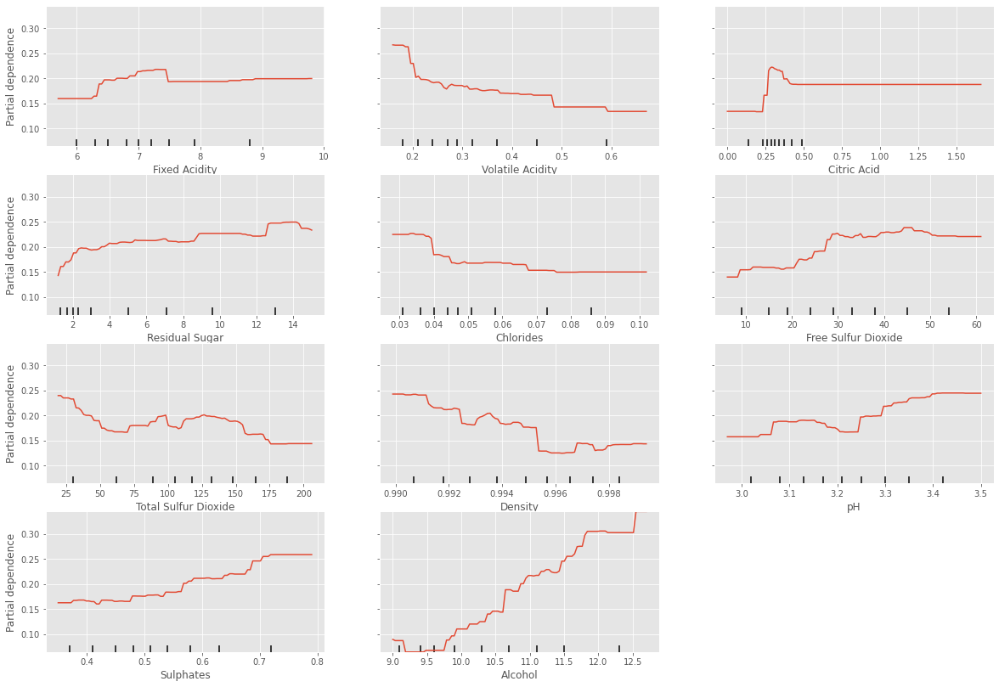

In [7]:
fig, ax = plt.subplots(figsize=(20, 14))
display = plot_partial_dependence(model, X, features=numeric_columns, n_jobs=-1, grid_resolution=100, ax=ax,
kind='average')

### Individual Conditional Expectations (ICE) Plot

To obtain ICE plots, simply change the `kind` argument to `'individual'` or `'both'`. For datasets above a few hundred observations, ICE plots quickly become too busy to be useful. The `'subsample'` argument (either `int` for absolute number of samples or `float` for relative proportions) can be used to reduce the number of plotted samples.

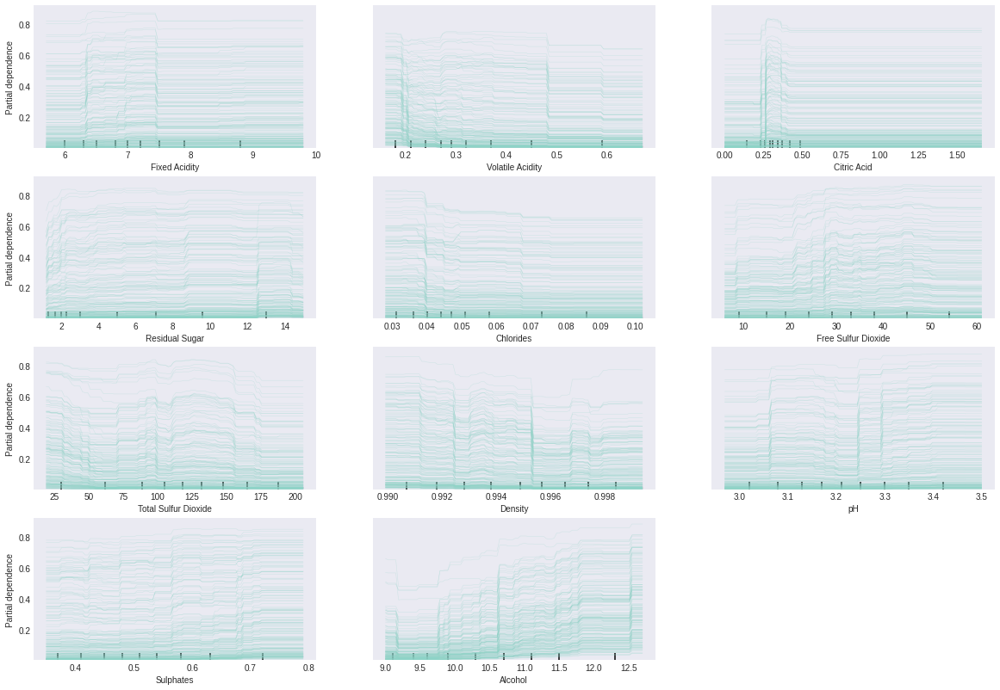

In [23]:
fig, ax = plt.subplots(figsize=(20, 14))
display = plot_partial_dependence(model, X, features=numeric_columns, n_jobs=-1, ax=ax,
kind='individual', subsample=200)

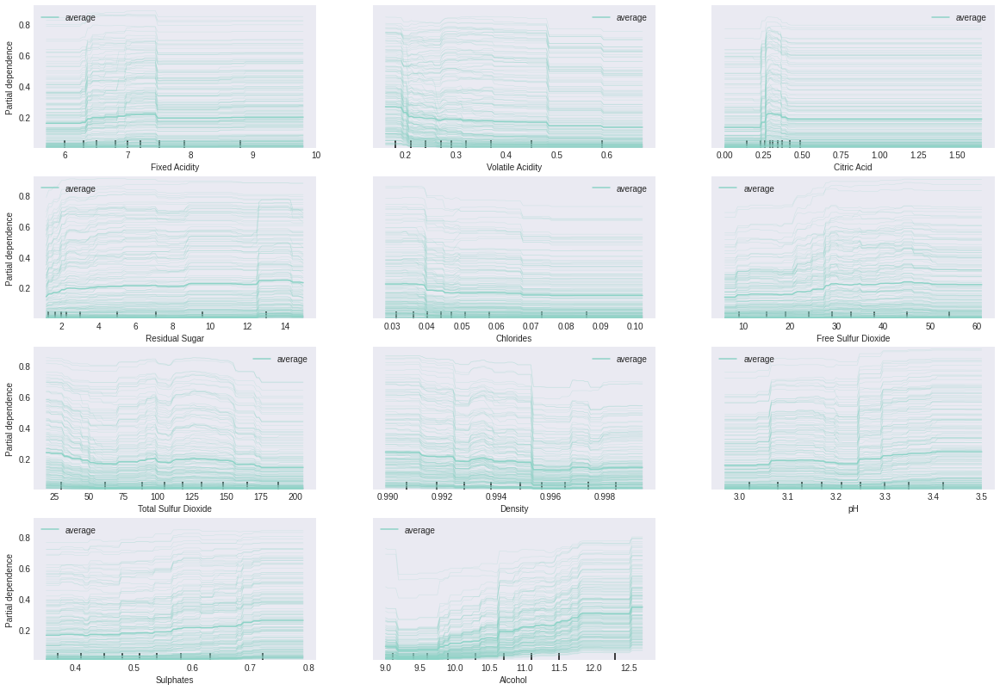

In [24]:
fig, ax = plt.subplots(figsize=(20, 14))
display = plot_partial_dependence(model, X, features=X.select_dtypes('float').columns, n_jobs=-1, ax=ax,
kind='both', subsample=200)

### Two-way Partial Dependence Plots

In [ ]:
for col in numeric_columns:
    features = list(zip_longest(numeric_columns.drop(col), [col]*(len(numeric_columns)-1)))
    fig, ax = plt.subplots(figsize=(20, 14))
    display = plot_partial_dependence(model, X, features=features, n_jobs=-1, grid_resolution=100, ax=ax,
kind='average')


In [27]:
col = numeric_columns[0]

Index(['Volatile Acidity', 'Citric Acid', 'Residual Sugar', 'Chlorides',
       'Free Sulfur Dioxide', 'Total Sulfur Dioxide', 'Density', 'pH',
       'Sulphates', 'Alcohol'],
      dtype='object')

[('Volatile Acidity', 'Fixed Acidity'),
 ('Citric Acid', 'Fixed Acidity'),
 ('Residual Sugar', 'Fixed Acidity'),
 ('Chlorides', 'Fixed Acidity'),
 ('Free Sulfur Dioxide', 'Fixed Acidity'),
 ('Total Sulfur Dioxide', 'Fixed Acidity'),
 ('Density', 'Fixed Acidity'),
 ('pH', 'Fixed Acidity'),
 ('Sulphates', 'Fixed Acidity'),
 ('Alcohol', 'Fixed Acidity')]

In [ ]:
for col in numeric_columns:
    